In [37]:
import sys
sys.path.append("..") 
from dataset.SwissImageDataset   import SwissImage, unnormalize_batch
import numpy as np
import matplotlib.pyplot as plt
import torch
from matplotlib.colors import ListedColormap
import pandas as pd
%load_ext autoreload
%autoreload 2


from PIL import Image

sys.path.append("..") 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [38]:
img_dir = '/home/valerie/data/rocky_tlm/rgb/'  #'/data/xiaolong/rgb'
dem_dir = '/home/valerie/data/rocky_tlm/dem/' # /data/xiaolong/dem'
mask_dir = '/home/valerie/data/ace_alps/mask'
test_list_csv = '/home/valerie/Projects/Alps_LCC/data/split/interesting_dataset.csv'

In [39]:
df = pd.read_csv(test_list_csv)
df.head()

,rbg,dem,mask,mainclass
0,26403_11058_rgb.tif,26403_11058_dem.tif,26403_11058_label.tif,3.0
1,26370_11109_rgb.tif,26370_11109_dem.tif,26370_11109_label.tif,3.0
2,26318_11151_rgb.tif,26318_11151_dem.tif,26318_11151_label.tif,4.0
3,26366_11119_rgb.tif,26366_11119_dem.tif,26366_11119_label.tif,3.0
4,26308_11133_rgb.tif,26308_11133_dem.tif,26308_11133_label.tif,3.0


In [40]:
cls2idx = {'Background':0, "Bedrock" : 1, "Bedrockwith grass" : 2,
                    "Large blocks" : 3, "Large blocks with grass" : 4, 
                    "river" : 5,     "bush forest" : 6,
                    "scree" : 7,
                    'scree with grass': 8,
                    "Glacier" : 9,
                    'lake':10,
                    'humid':11, 
                    "Forest" : 12,
                    'forest':13,
                    'forest':14
                     
                    } 

idx2cls = {  cls2idx [ x ] :x for x in cls2idx.keys() }
idx2cls 

{0: 'Background',
 1: 'Bedrock',
 2: 'Bedrockwith grass',
 3: 'Large blocks',
 4: 'Large blocks with grass',
 5: 'river',
 6: 'bush forest',
 7: 'scree',
 8: 'scree with grass',
 9: 'Glacier',
 10: 'lake',
 11: 'humid',
 12: 'Forest',
 14: 'forest'}

In [41]:
pd.unique(df.mainclass),df.keys()


(array([3., 4., 1., 5., 7., 9.]),
 Index(['rbg', 'dem', 'mask', 'mainclass'], dtype='object'))

rbg            26403_11058_rgb.tif
dem            26403_11058_dem.tif
mask         26403_11058_label.tif
mainclass                      3.0
Name: 0, dtype: object


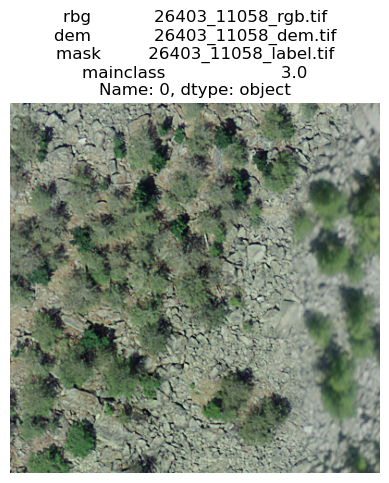

rbg            26370_11109_rgb.tif
dem            26370_11109_dem.tif
mask         26370_11109_label.tif
mainclass                      3.0
Name: 1, dtype: object


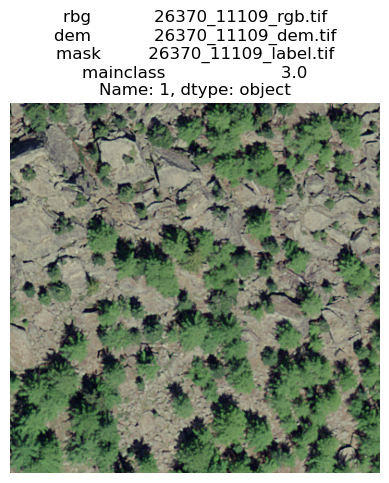

rbg            26318_11151_rgb.tif
dem            26318_11151_dem.tif
mask         26318_11151_label.tif
mainclass                      4.0
Name: 2, dtype: object


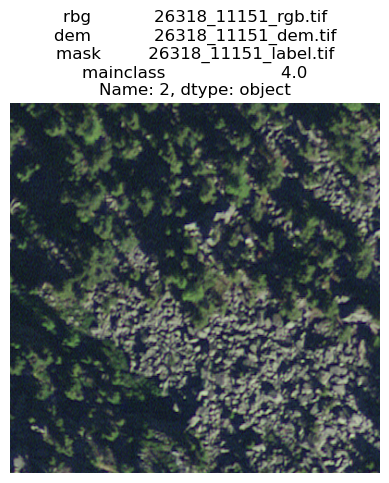

rbg            26366_11119_rgb.tif
dem            26366_11119_dem.tif
mask         26366_11119_label.tif
mainclass                      3.0
Name: 3, dtype: object


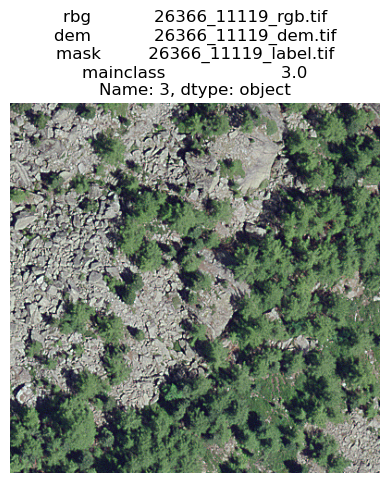

rbg            26308_11133_rgb.tif
dem            26308_11133_dem.tif
mask         26308_11133_label.tif
mainclass                      3.0
Name: 4, dtype: object


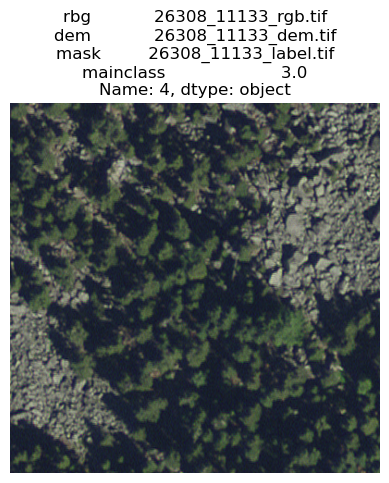

rbg            25882_11332_rgb.tif
dem            25882_11332_dem.tif
mask         25882_11332_label.tif
mainclass                      4.0
Name: 5, dtype: object


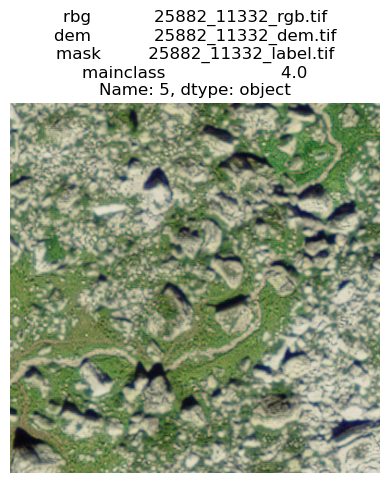

rbg            25847_11298_rgb.tif
dem            25847_11298_dem.tif
mask         25847_11298_label.tif
mainclass                      1.0
Name: 6, dtype: object


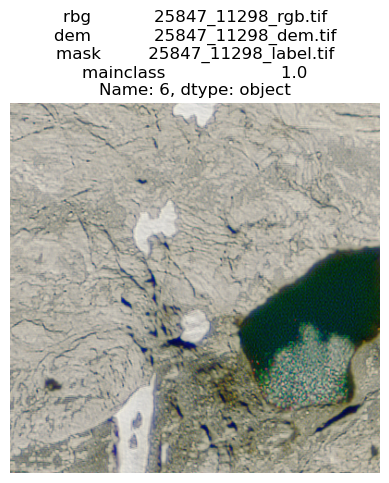

rbg            25659_11101_rgb.tif
dem            25659_11101_dem.tif
mask         25659_11101_label.tif
mainclass                      1.0
Name: 7, dtype: object


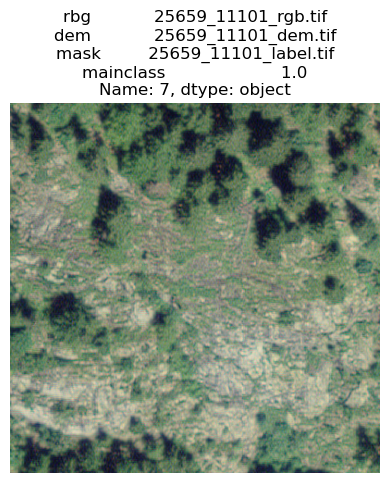

rbg            25869_11328_rgb.tif
dem            25869_11328_dem.tif
mask         25869_11328_label.tif
mainclass                      3.0
Name: 8, dtype: object


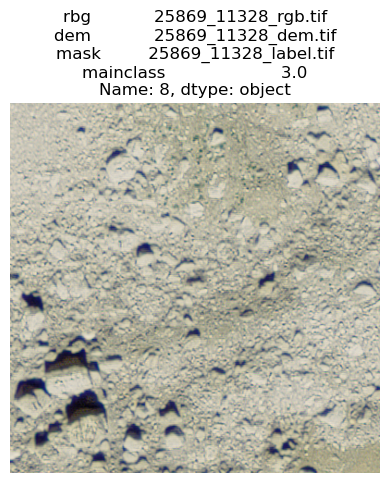

rbg            26610_11328_rgb.tif
dem            26610_11328_dem.tif
mask         26610_11328_label.tif
mainclass                      3.0
Name: 9, dtype: object


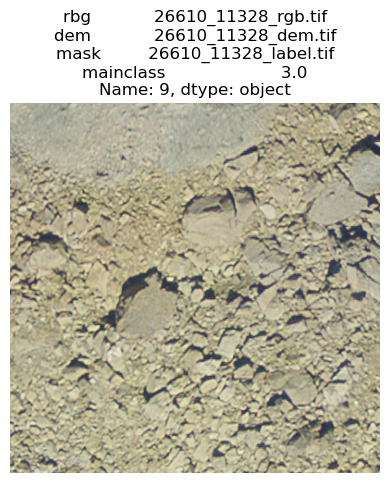

rbg            25881_11333_rgb.tif
dem            25881_11333_dem.tif
mask         25881_11333_label.tif
mainclass                      4.0
Name: 10, dtype: object


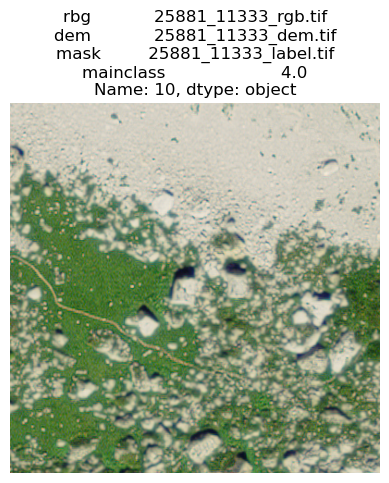

rbg            26308_11149_rgb.tif
dem            26308_11149_dem.tif
mask         26308_11149_label.tif
mainclass                      4.0
Name: 11, dtype: object


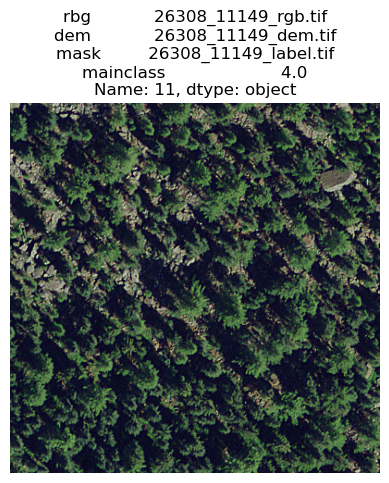

rbg            25857_11277_rgb.tif
dem            25857_11277_dem.tif
mask         25857_11277_label.tif
mainclass                      4.0
Name: 12, dtype: object


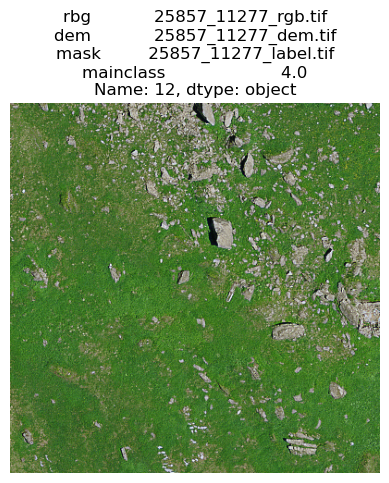

rbg            25819_11343_rgb.tif
dem            25819_11343_dem.tif
mask         25819_11343_label.tif
mainclass                      5.0
Name: 13, dtype: object


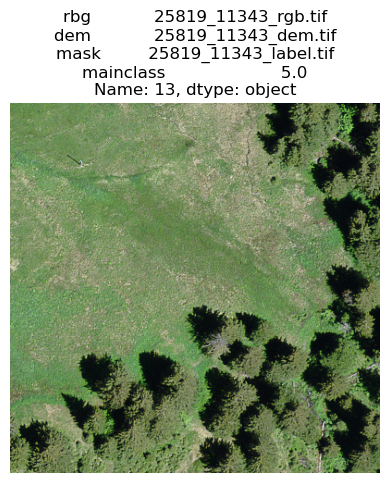

rbg            25954_10892_rgb.tif
dem            25954_10892_dem.tif
mask         25954_10892_label.tif
mainclass                      5.0
Name: 14, dtype: object


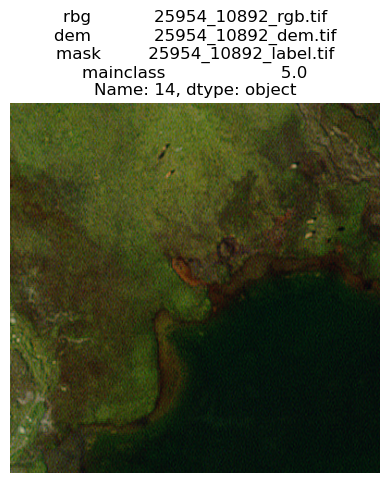

rbg            26048_11139_rgb.tif
dem            26048_11139_dem.tif
mask         26048_11139_label.tif
mainclass                      5.0
Name: 15, dtype: object


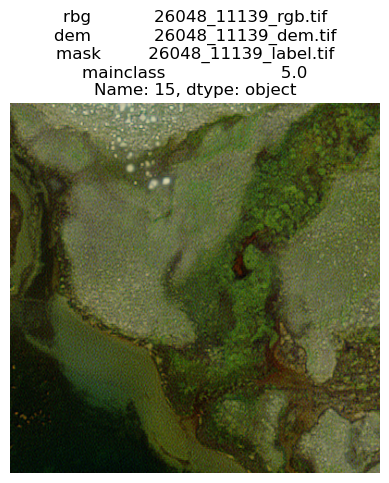

rbg            26041_11004_rgb.tif
dem            26041_11004_dem.tif
mask         26041_11004_label.tif
mainclass                      7.0
Name: 16, dtype: object


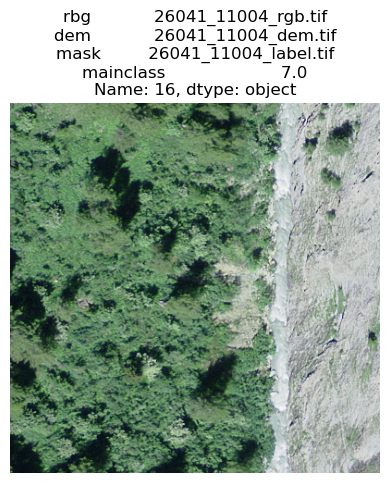

rbg            25757_10998_rgb.tif
dem            25757_10998_dem.tif
mask         25757_10998_label.tif
mainclass                      7.0
Name: 17, dtype: object


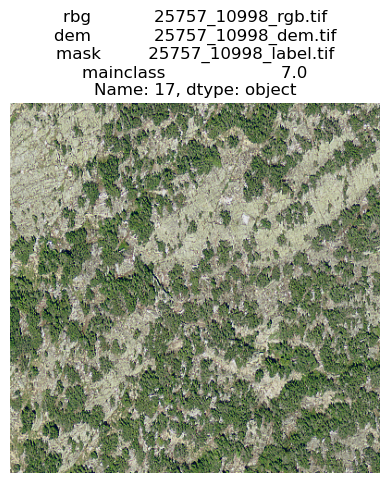

rbg            25811_10849_rgb.tif
dem            25811_10849_dem.tif
mask         25811_10849_label.tif
mainclass                      7.0
Name: 18, dtype: object


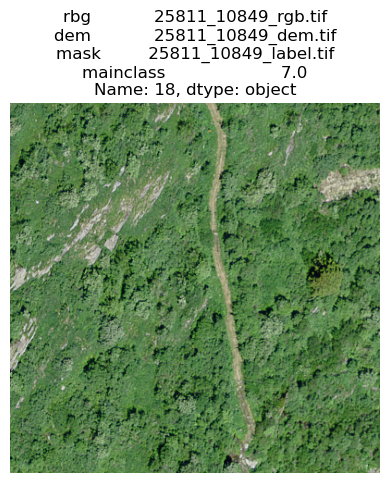

rbg            25861_10980_rgb.tif
dem            25861_10980_dem.tif
mask         25861_10980_label.tif
mainclass                      7.0
Name: 19, dtype: object


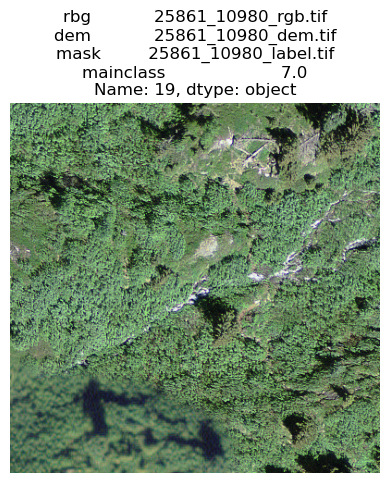

rbg            26080_11014_rgb.tif
dem            26080_11014_dem.tif
mask         26080_11014_label.tif
mainclass                      7.0
Name: 20, dtype: object


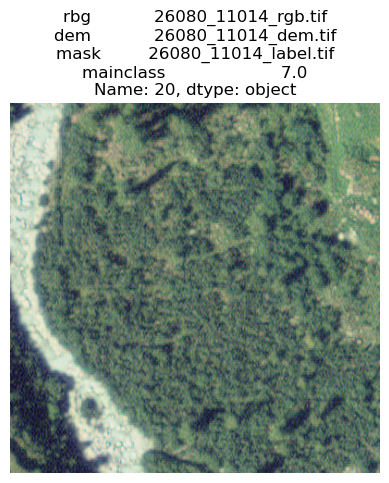

rbg            26301_10891_rgb.tif
dem            26301_10891_dem.tif
mask         26301_10891_label.tif
mainclass                      9.0
Name: 21, dtype: object


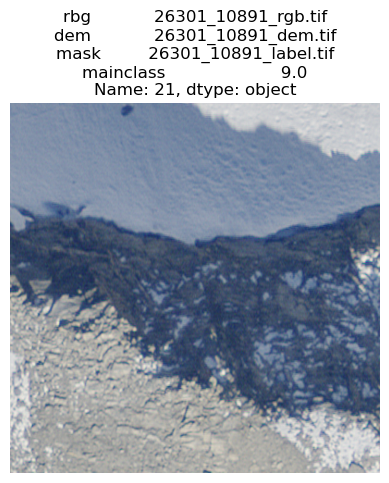

rbg            25939_10979_rgb.tif
dem            25939_10979_dem.tif
mask         25939_10979_label.tif
mainclass                      9.0
Name: 22, dtype: object


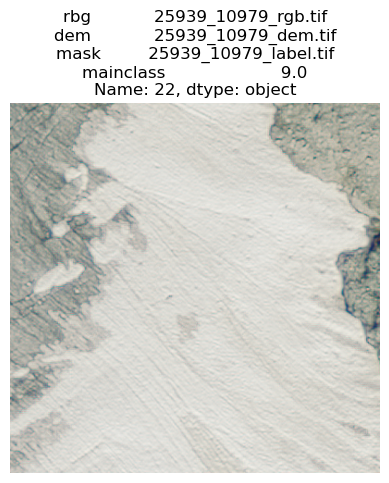

In [42]:

counter=0
for index, row in df.iterrows():

    if True :
        image = Image.open(img_dir + df.rbg[index] )
        
        
        # Plot the RGB image
        plt.imshow(image)
        plt.axis('off')  # Remove axis labels and ticks
        plt.title( str(df.iloc[index]) )
        print(str(df.iloc[index]) )
        plt.show()
        counter+=1
        
        if counter >50 :
            break
        
    
   

    
        
    